## <a name="abstract">Titanic Machine Learning From Disaster</a>

Abstract The sinking of the RMS Titanic is one of the most infamous shipwrecks in history. On April 15, 1912, during her maiden voyage, the Titanic sank after colliding with an iceberg, killing 1502 out of 2224 passengers and crew. This sensational tragedy shocked the international community and led to better safety regulations for ships.
One of the reasons that the shipwreck led to such loss of life was that there were not enough lifeboats for the passengers and crew. Although there was some element of luck involved in surviving the sinking, some groups of people were more likely to survive than others, such as women, children, and the upper-class.
In this challenge, we ask you to complete the analysis of what sorts of people were likely to survive. In particular, we ask you to apply the tools of machine learning to predict which passengers survived the tragedy.

In [1]:
using DataFrames
using MLBase
using ColorBrewer
using XGBoost
using Gadfly

  likely near /Users/diego/.julia/v0.4/MLBase/src/modeltune.jl:5
  likely near /Users/diego/.julia/v0.4/MLBase/src/modeltune.jl:5
  likely near /Users/diego/.julia/v0.4/MLBase/src/modeltune.jl:5
  likely near /Users/diego/.julia/v0.4/MLBase/src/deprecated/datapre.jl:104
  likely near /Users/diego/.julia/v0.4/MLBase/src/deprecated/datapre.jl:105
  likely near /Users/diego/.julia/v0.4/MLBase/src/deprecated/datapre.jl:163
  likely near /Users/diego/.julia/v0.4/MLBase/src/deprecated/datapre.jl:163
  likely near /Users/diego/.julia/v0.4/MLBase/src/deprecated/datapre.jl:163


## Load Preprocessed Data

In [214]:
train = readtable("./data/train_enriched.tsv", separator='\t')
test = readtable("./data/test_enriched.tsv", separator='\t')
all = readtable("./data/titanic.csv")

names_dict = Dict({last(t) => first(t) for t in enumerate(all[:name])})
for n in test[:Name]
    if haskey(names_dict, n)
        
    end
end
test[:Survived] = map(n -> haskey(names_dict, n)? all[names_dict[n], :survived] : 0, test[:Name]);


Use "Dict{Any,Any}([a=>b for (a,b) in c])" instead.


In [215]:
features = [:Pclass, :Sex, :Age, :SibSp, :Parch, :Fare, :Embarked,
            :Title, :FamilySize, :IsMother, :IsChild, :IsSmallFamily,
            :CabinPrefix, :CabinNumber]
label = :Survived;

In [216]:
train_x = Array{Float64}(train[:, features])
train_y = Array{Float64}(train[:, label])
test_x = Array{Float64}(test[:, features]);

## Training

In [282]:
greens = palette("Greens", 9)
blues = palette("Blues", 9)
reds = palette("Reds", 9)

function sample_train_val(data, features, label, split_p=.8)
    nrows = size(data, 1)
    split_size = round(Int, nrows*split_p)
    sample_index = shuffle(collect(1:nrows))
    train_x = Array{Float64}(data[sample_index[1:split_size], features])
    train_y = Array{Float64}(data[sample_index[1:split_size], label])
    val_x = Array{Float64}(data[sample_index[split_size+1:end], features])
    val_y = Array{Float64}(data[sample_index[split_size+1:end], label])
    return train_x, train_y, val_x, val_y
end

binarize{T <: Number}(y::Array{T,1}) = Array{Int8,1}(y .>= .5)
function calc_accuracy{T <: Number, N <: Number}(yreal::Array{T,1}, ypred::Array{N,1})
    nrows = length(yreal)
    preds_diff = map(i -> yreal[i] == (ypred[i] >= .5? 1:0), vcat(1:nrows))
    return round(sum(preds_diff)/nrows, 2)  
end

function train_gb(X, Y, num_round, params; show_training_time=true)
    show_training_time && tic() 
    model = XGBoost.xgboost(X, num_round, label=Y, param=params)
    show_training_time && toc()
    return model
end

function train_eval_gb(TX, TY, VX, VY, num_round, params; show_training_time=true)
    dtrain = DMatrix(TX, label = TY)
    dtest = DMatrix(VX, label = VY)
    watchlist = [(dtest,"eval"), (dtrain,"train")]
    model = XGBoost.xgboost(TX, num_round, label=TY, param=params)
    ypred_train = XGBoost.predict(model, TX)
    ypred_val = XGBoost.predict(model, VX)
    ypred_test = XGBoost.predict(model, test_x)
    acc_train = calc_accuracy(TY, ypred_train)
    acc_val = calc_accuracy(VY, ypred_val)
    acc_test = calc_accuracy(Array{Int8}(test[:Survived]), ypred_test)
    return model, acc_train, acc_val, acc_test
end

function tunning_param_ntimes(data, features, label, num_rounds, params, 
                              key, values, ntimes)
    accs_trains = Array[]
    accs_vals = Array[]
    accs_tests = Array[]
    for n=1:ntimes
        _, accs_train, accs_val, accs_test = tunning_param(sample_train_val(data, features, label)...,
                                                           num_rounds, params, key, values, 
                                                           show_training_time=false)
        push!(accs_trains, accs_train)
        push!(accs_vals, accs_val)
        push!(accs_tests, accs_test)
    end
    plot_multi_tunning(key, values, accs_trains, accs_vals, accs_tests)
end

function tunning_param(TX, TY, VX, VY, num_rounds, params, key, values; 
                       show_training_time=true)
    models = []
    accs_train = []
    accs_val = []
    accs_test = []
    params_tunning = copy(params)
    
    for value in values
        if haskey(params_tunning, key)
            params_tunning[key] = value
        elseif key == "num_rounds"
            num_rounds = value
        end
        model, acc_train, acc_val, acc_test = train_eval_gb(TX, TY, VX, VY, num_rounds,
                                                            params_tunning,
                                                            show_training_time=show_training_time)
        push!(models, model)
        push!(accs_train, acc_train)
        push!(accs_val, acc_val)
        push!(accs_test, acc_test)
    end
    return models, accs_train, accs_val, accs_test
end

function plot_tunning(key, values, accs_train, accs_val)
    set_default_plot_size(1000px, 500px)
    plot(
        layer(x=values, y=accs_train, Geom.line, Geom.point, 
              Theme(default_color=colorant"lightgreen", line_width=2px)),
        layer(x=values, y=accs_val, Geom.line, Geom.point, 
              Theme(default_color=colorant"deepskyblue", line_width=2px)),
        Scale.x_discrete, Guide.xlabel(key), Guide.ylabel("Acc"), 
        Guide.title("Parameter Tunning"), 
        Guide.manual_color_key("Legend", ["Tra", "Val"], ["lightgreen", "deepskyblue"])
    )
end

function plot_multi_tunning(key, values, accs_trains, accs_vals, accs_tests)
    set_default_plot_size(1000px, 500px)
    
    layers = [layer(x=values, y=accs, Geom.line, Geom.point, 
                    Theme(default_color=blues[3], line_width=2px)) 
                    for accs in accs_trains]
    
    append!(layers, [layer(x=values, y=accs, Geom.line, Geom.point, 
                     Theme(default_color=greens[3], line_width=2px)) 
                     for accs in accs_vals])
    
    append!(layers, [layer(x=values, y=accs, Geom.line, Geom.point, 
                     Theme(default_color=reds[3], line_width=2px)) 
                     for accs in accs_tests])
    
    avg_train = reshape(vcat(accs_trains...), (length(accs_trains[1]), size(accs_trains, 1)))
    avg_train = map(i -> mean(avg_train[i, :]), vcat(1:size(avg_train, 1)))
    
    avg_val = reshape(vcat(accs_vals...), (length(accs_vals[1]), size(accs_vals, 1)))
    avg_val = map(i -> mean(avg_val[i, :]), vcat(1:size(avg_val, 1)))
    
    avg_test = reshape(vcat(accs_tests...), (length(accs_tests[1]), size(accs_tests, 1)))
    avg_test = map(i -> mean(avg_test[i, :]), vcat(1:size(avg_test, 1)))
    
    unshift!(layers, layer(x=values, y=avg_train, Geom.line, Geom.point, 
                           Theme(default_color=blues[6], line_width=4px)))
    
    unshift!(layers, layer(x=values, y=avg_val, Geom.line, Geom.point, 
                           Theme(default_color=greens[6], line_width=4px)))
    
    unshift!(layers, layer(x=values, y=avg_test, Geom.line, Geom.point, 
                           Theme(default_color=reds[6], line_width=4px)))
    
    plot(layers..., Scale.x_discrete, Guide.xlabel(key), Guide.ylabel("Acc"), 
    Guide.title("Parameter Tunning"), Guide.manual_color_key("Phase", 
    ["Training", "Validation", "Test"], [blues[6], greens[6], reds[6]]))
end

plot_multi_tunning (generic function with 2 methods)

In [36]:
num_round = 50
params = Dict({"max_depth"=>8, "eta"=> .1, "subsample" => .5, "objective"=>"binary:logistic"})
model = train_gb(train_x, train_y, num_round, params)
ypred = XGBoost.predict(model, train_x)
ypred_submission = binarize(XGBoost.predict(model, test_x));


Use "Dict{Any,Any}(a=>b, ...)" instead.
[1]	train-error:0.150393
[2]	train-error:0.136925


elapsed time: 0.

[3]	train-error:0.127946
[4]	train-error:0.132435
[5]	train-error:0.125701
[6]	train-error:0.124579
[7]	train-error:0.120090
[8]	train-error:0.115600
[9]	train-error:0.113356
[10]	train-error:0.111111
[11]	train-error:0.111111
[12]	train-error:0.112233
[13]	train-error:0.116723
[14]	train-error:0.118967
[15]	train-error:0.109989
[16]	train-error:0.114478
[17]	train-error:0.112233
[18]	train-error:0.112233
[19]	train-error:0.108866
[20]	train-error:0.108866
[21]	train-error:0.104377
[22]	train-error:0.102132
[23]	train-error:0.102132
[24]	train-error:0.097643
[25]	train-error:0.096521
[26]	train-error:0.099888
[27]	train-error:0.099888
[28]	train-error:0.098765
[29]	train-error:0.097643
[30]	train-error:0.096521
[31]	train-error:0.098765
[32]	train-error:0.096521
[33]	train-error:0.096521
[34]	train-error:0.096521
[35]	train-error:0.094276
[36]	train-error:0.089787
[37]	train-error:0.092031
[38]	train-error:0.092031
[39]	train-error:0.093154
[40]	train-error:0.095398
[41]	train-error:0.

In [38]:
calc_accuracy(train_y, ypred)

0.91

## Tunning Parameters


Use "Dict(a=>b, ...)" instead.
[1]	train-error:0.148668
[2]	train-error:0.140252
[3]	train-error:0.123422
[4]	train-error:0.119215
[5]	train-error:0.123422
[6]	train-error:0.119215
[7]	train-error:0.116410
[8]	train-error:0.119215
[9]	train-error:0.115007
[10]	train-error:0.115007
[11]	train-error:0.112202
[12]	train-error:0.112202
[13]	train-error:0.110799
[14]	train-error:0.112202
[15]	train-error:0.109397
[16]	train-error:0.106592
[17]	train-error:0.105189
[18]	train-error:0.105189
[19]	train-error:0.107994
[20]	train-error:0.103787
[21]	train-error:0.105189
[22]	train-error:0.102384
[23]	train-error:0.100982
[24]	train-error:0.103787
[25]	train-error:0.103787
[26]	train-error:0.103787
[27]	train-error:0.100982
[28]	train-error:0.099579
[29]	train-error:0.096774
[30]	train-error:0.098177
[31]	train-error:0.100982
[32]	train-error:0.102384
[33]	train-error:0.099579
[34]	train-error:0.096774
[35]	train-error:0.095372
[36]	train-error:0.096774
[37]	train-error:0.095372
[38]	train-erro

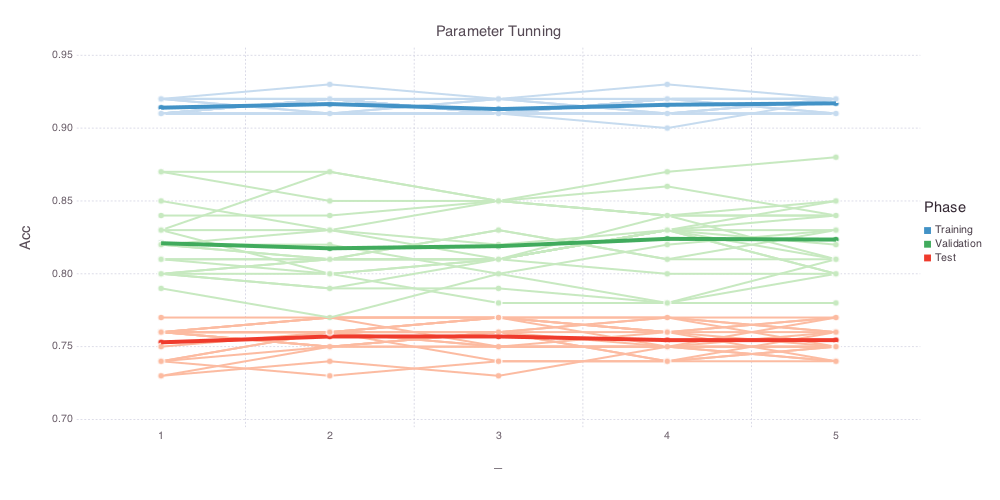

[38]	train-error:0.085554
[39]	train-error:0.085554
[40]	train-error:0.084151
[41]	train-error:0.082749
[42]	train-error:0.085554
[43]	train-error:0.084151
[44]	train-error:0.085554
[45]	train-error:0.085554
[46]	train-error:0.085554
[47]	train-error:0.088359
[48]	train-error:0.086957
[49]	train-error:0.086957
[50]	train-error:0.082749
[1]	train-error:0.144460
[2]	train-error:0.133240
[3]	train-error:0.127630
[4]	train-error:0.130435
[5]	train-error:0.129032
[6]	train-error:0.119215
[7]	train-error:0.123422
[8]	train-error:0.129032
[9]	train-error:0.124825
[10]	train-error:0.123422
[11]	train-error:0.126227
[12]	train-error:0.126227
[13]	train-error:0.129032
[14]	train-error:0.120617
[15]	train-error:0.124825
[16]	train-error:0.120617
[17]	train-error:0.117812
[18]	train-error:0.115007
[19]	train-error:0.112202
[20]	train-error:0.109397
[21]	train-error:0.103787
[22]	train-error:0.105189
[23]	train-error:0.103787
[24]	train-error:0.103787
[25]	train-error:0.102384
[26]	train-error:0.10

In [283]:
#params = Dict({"max_depth"=>8, "eta"=>.1, "subsample"=>.5, "objective"=>"binary:logistic"})
param = ["booster"=>"gblinear", "eta"=>1, "silent"=>0, "subsample"=>.5,
         "objective"=>"binary:logistic", "alpha"=>0.0001, "lambda"=>.0001]
num_rounds = 50; key = "_"; values = collect(1:5)
tunning_param_ntimes(train, features, label, num_rounds, params, key, values, 20)

Best parameters after iteractive analysis is:
- Max Depth: 8
- ETA: .1
- Subsample: .5
- Num Rounds 50

### Choose Best of N Trials

In [40]:
params = Dict({"max_depth"=>8, "eta"=>.1, "subsample"=>.5, "objective"=>"binary:logistic"})

best_model = Union{}
best_acc = 0
minor_train_test_acc = 1
trials = 5000

for n=1:trials
    model, acc_train, acc_val = train_eval_gb(sample_train_val(train, features, label, .9)..., 
                                              50, params, show_training_time=false)
    diff_train_test_acc = acc_train - acc_val
    if acc_val >= best_acc && diff_train_test_acc <= .05 && 
       diff_train_test_acc < minor_train_test_acc
        best_model = model
        best_acc = acc_val
        minor_train_test_acc = diff_train_test_acc
    end
    n % 100 == 0 && println("Trial $n, Acc Tra: $acc_train, Acc Val: $acc_val [Best Acc: $best_acc]")
end
ypred_submission = binarize(XGBoost.predict(best_model, test_x));


Use "Dict{Any,Any}(a=>b, ...)" instead.
[1]	train-error:0.152120
[2]	train-error:0.130923
[3]	train-error:0.135910
[4]	train-error:0.125935
[5]	train-error:0.120948
[6]	train-error:0.120948
[7]	train-error:0.122195
[8]	train-error:0.113466
[9]	train-error:0.114713
[10]	train-error:0.112219
[11]	train-error:0.117207
[12]	train-error:0.113466
[13]	train-error:0.114713
[14]	train-error:0.115960
[15]	train-error:0.114713
[16]	train-error:0.118454
[17]	train-error:0.112219
[18]	train-error:0.113466
[19]	train-error:0.105985
[20]	train-error:0.107232
[21]	train-error:0.105985
[22]	train-error:0.108479
[23]	train-error:0.108479
[24]	train-error:0.103491
[25]	train-error:0.098504
[26]	train-error:0.097257
[27]	train-error:0.100998
[28]	train-error:0.100998
[29]	train-error:0.098504
[30]	train-error:0.096010
[31]	train-error:0.094763
[32]	train-error:0.093516
[33]	train-error:0.092269
[34]	train-error:0.092269
[35]	train-error:0.094763
[36]	train-error:0.093516
[37]	train-error:0.089776
[38]	t

Trial 100, Acc Tra: 0.91, Acc Val: 0.82 [Best Acc: 0.92]


[10]	train-error:0.127182
[11]	train-error:0.122195
[12]	train-error:0.118454
[13]	train-error:0.122195
[14]	train-error:0.120948
[15]	train-error:0.114713
[16]	train-error:0.112219
[17]	train-error:0.110973
[18]	train-error:0.113466
[19]	train-error:0.110973
[20]	train-error:0.113466
[21]	train-error:0.110973
[22]	train-error:0.110973
[23]	train-error:0.110973
[24]	train-error:0.110973
[25]	train-error:0.109726
[26]	train-error:0.110973
[27]	train-error:0.109726
[28]	train-error:0.110973
[29]	train-error:0.105985
[30]	train-error:0.105985
[31]	train-error:0.107232
[32]	train-error:0.102244
[33]	train-error:0.104738
[34]	train-error:0.103491
[35]	train-error:0.104738
[36]	train-error:0.100998
[37]	train-error:0.107232
[38]	train-error:0.100998
[39]	train-error:0.103491
[40]	train-error:0.100998
[41]	train-error:0.100998
[42]	train-error:0.096010
[43]	train-error:0.098504
[44]	train-error:0.096010
[45]	train-error:0.094763
[46]	train-error:0.093516
[47]	train-error:0.093516
[48]	train-e

Trial 200, Acc Tra: 0.91, Acc Val: 0.87 [Best Acc: 0.92]


[27]	train-error:0.110973
[28]	train-error:0.110973
[29]	train-error:0.105985
[30]	train-error:0.107232
[31]	train-error:0.105985
[32]	train-error:0.100998
[33]	train-error:0.099751
[34]	train-error:0.097257
[35]	train-error:0.098504
[36]	train-error:0.098504
[37]	train-error:0.097257
[38]	train-error:0.098504
[39]	train-error:0.096010
[40]	train-error:0.100998
[41]	train-error:0.098504
[42]	train-error:0.098504
[43]	train-error:0.096010
[44]	train-error:0.097257
[45]	train-error:0.093516
[46]	train-error:0.094763
[47]	train-error:0.096010
[48]	train-error:0.092269
[49]	train-error:0.089776
[50]	train-error:0.093516
[1]	train-error:0.159601
[2]	train-error:0.152120
[3]	train-error:0.140898
[4]	train-error:0.135910
[5]	train-error:0.127182
[6]	train-error:0.128429
[7]	train-error:0.127182
[8]	train-error:0.125935
[9]	train-error:0.129676
[10]	train-error:0.130923
[11]	train-error:0.125935
[12]	train-error:0.128429
[13]	train-error:0.123441
[14]	train-error:0.122195
[15]	train-error:0.12

Trial 300, Acc Tra: 0.92, Acc Val: 0.78 [Best Acc: 0.92]


[48]	train-error:0.083541
[49]	train-error:0.084788
[50]	train-error:0.083541
[1]	train-error:0.145885
[2]	train-error:0.145885
[3]	train-error:0.134663
[4]	train-error:0.129676
[5]	train-error:0.123441
[6]	train-error:0.119701
[7]	train-error:0.122195
[8]	train-error:0.113466
[9]	train-error:0.119701
[10]	train-error:0.117207
[11]	train-error:0.118454
[12]	train-error:0.112219
[13]	train-error:0.114713
[14]	train-error:0.107232
[15]	train-error:0.109726
[16]	train-error:0.109726
[17]	train-error:0.109726
[18]	train-error:0.107232
[19]	train-error:0.104738
[20]	train-error:0.105985
[21]	train-error:0.105985
[22]	train-error:0.103491
[23]	train-error:0.107232
[24]	train-error:0.105985
[25]	train-error:0.102244
[26]	train-error:0.100998
[27]	train-error:0.100998
[28]	train-error:0.097257
[29]	train-error:0.094763
[30]	train-error:0.094763
[31]	train-error:0.093516
[32]	train-error:0.094763
[33]	train-error:0.094763
[34]	train-error:0.096010
[35]	train-error:0.093516
[36]	train-error:0.09

Trial 400, Acc Tra: 0.92, Acc Val: 0.88 [Best Acc: 0.92]


[24]	train-error:0.100998
[25]	train-error:0.098504
[26]	train-error:0.098504
[27]	train-error:0.098504
[28]	train-error:0.099751
[29]	train-error:0.097257
[30]	train-error:0.097257
[31]	train-error:0.099751
[32]	train-error:0.099751
[33]	train-error:0.099751
[34]	train-error:0.093516
[35]	train-error:0.097257
[36]	train-error:0.096010
[37]	train-error:0.097257
[38]	train-error:0.096010
[39]	train-error:0.097257
[40]	train-error:0.092269
[41]	train-error:0.091022
[42]	train-error:0.092269
[43]	train-error:0.089776
[44]	train-error:0.086035
[45]	train-error:0.087282
[46]	train-error:0.088529
[47]	train-error:0.088529
[48]	train-error:0.088529
[49]	train-error:0.086035
[50]	train-error:0.083541
[1]	train-error:0.143392
[2]	train-error:0.134663
[3]	train-error:0.133416
[4]	train-error:0.129676
[5]	train-error:0.128429
[6]	train-error:0.129676
[7]	train-error:0.125935
[8]	train-error:0.115960
[9]	train-error:0.119701
[10]	train-error:0.118454
[11]	train-error:0.110973
[12]	train-error:0.10

Trial 500, Acc Tra: 0.9, Acc Val: 0.88 [Best Acc: 0.92]


[1]	train-error:0.182045
[2]	train-error:0.138404
[3]	train-error:0.139651
[4]	train-error:0.139651
[5]	train-error:0.142145
[6]	train-error:0.124688
[7]	train-error:0.119701
[8]	train-error:0.125935
[9]	train-error:0.123441
[10]	train-error:0.122195
[11]	train-error:0.120948
[12]	train-error:0.122195
[13]	train-error:0.117207
[14]	train-error:0.122195
[15]	train-error:0.123441
[16]	train-error:0.118454
[17]	train-error:0.118454
[18]	train-error:0.118454
[19]	train-error:0.118454
[20]	train-error:0.113466
[21]	train-error:0.114713
[22]	train-error:0.110973
[23]	train-error:0.113466
[24]	train-error:0.110973
[25]	train-error:0.109726
[26]	train-error:0.109726
[27]	train-error:0.109726
[28]	train-error:0.104738
[29]	train-error:0.108479
[30]	train-error:0.102244
[31]	train-error:0.107232
[32]	train-error:0.102244
[33]	train-error:0.104738
[34]	train-error:0.102244
[35]	train-error:0.100998
[36]	train-error:0.100998
[37]	train-error:0.100998
[38]	train-error:0.099751
[39]	train-error:0.10

Trial 600, Acc Tra: 0.92, Acc Val: 0.82 [Best Acc: 0.92]


[12]	train-error:0.110973
[13]	train-error:0.108479
[14]	train-error:0.112219
[15]	train-error:0.109726
[16]	train-error:0.109726
[17]	train-error:0.108479
[18]	train-error:0.107232
[19]	train-error:0.107232
[20]	train-error:0.100998
[21]	train-error:0.098504
[22]	train-error:0.097257
[23]	train-error:0.094763
[24]	train-error:0.093516
[25]	train-error:0.094763
[26]	train-error:0.098504
[27]	train-error:0.093516
[28]	train-error:0.094763
[29]	train-error:0.092269
[30]	train-error:0.092269
[31]	train-error:0.089776
[32]	train-error:0.087282
[33]	train-error:0.092269
[34]	train-error:0.093516
[35]	train-error:0.093516
[36]	train-error:0.089776
[37]	train-error:0.091022
[38]	train-error:0.091022
[39]	train-error:0.088529
[40]	train-error:0.088529
[41]	train-error:0.086035
[42]	train-error:0.086035
[43]	train-error:0.083541
[44]	train-error:0.082294
[45]	train-error:0.082294
[46]	train-error:0.081047
[47]	train-error:0.081047
[48]	train-error:0.079801
[49]	train-error:0.079801
[50]	train-e

Trial 700, Acc Tra: 0.91, Acc Val: 0.81 [Best Acc: 0.92]


[37]	train-error:0.100998
[38]	train-error:0.100998
[39]	train-error:0.100998
[40]	train-error:0.100998
[41]	train-error:0.096010
[42]	train-error:0.097257
[43]	train-error:0.091022
[44]	train-error:0.086035
[45]	train-error:0.087282
[46]	train-error:0.091022
[47]	train-error:0.089776
[48]	train-error:0.094763
[49]	train-error:0.089776
[50]	train-error:0.088529
[1]	train-error:0.150873
[2]	train-error:0.147132
[3]	train-error:0.143392
[4]	train-error:0.135910
[5]	train-error:0.128429
[6]	train-error:0.123441
[7]	train-error:0.119701
[8]	train-error:0.118454
[9]	train-error:0.118454
[10]	train-error:0.112219
[11]	train-error:0.110973
[12]	train-error:0.115960
[13]	train-error:0.113466
[14]	train-error:0.113466
[15]	train-error:0.114713
[16]	train-error:0.114713
[17]	train-error:0.113466
[18]	train-error:0.114713
[19]	train-error:0.110973
[20]	train-error:0.113466
[21]	train-error:0.109726
[22]	train-error:0.105985
[23]	train-error:0.104738
[24]	train-error:0.104738
[25]	train-error:0.10

Trial 800, Acc Tra: 0.9, Acc Val: 0.88 [Best Acc: 0.92]


[28]	train-error:0.100998
[29]	train-error:0.099751
[30]	train-error:0.097257
[31]	train-error:0.097257
[32]	train-error:0.096010
[33]	train-error:0.099751
[34]	train-error:0.093516
[35]	train-error:0.097257
[36]	train-error:0.097257
[37]	train-error:0.096010
[38]	train-error:0.097257
[39]	train-error:0.093516
[40]	train-error:0.093516
[41]	train-error:0.092269
[42]	train-error:0.094763
[43]	train-error:0.093516
[44]	train-error:0.096010
[45]	train-error:0.094763
[46]	train-error:0.093516
[47]	train-error:0.093516
[48]	train-error:0.092269
[49]	train-error:0.092269
[50]	train-error:0.096010
[1]	train-error:0.150873
[2]	train-error:0.147132
[3]	train-error:0.135910
[4]	train-error:0.138404
[5]	train-error:0.140898
[6]	train-error:0.139651
[7]	train-error:0.135910
[8]	train-error:0.130923
[9]	train-error:0.129676
[10]	train-error:0.128429
[11]	train-error:0.127182
[12]	train-error:0.120948
[13]	train-error:0.120948
[14]	train-error:0.122195
[15]	train-error:0.118454
[16]	train-error:0.11

Trial 900, Acc Tra: 0.91, Acc Val: 0.9 [Best Acc: 0.92]


[25]	train-error:0.107232
[26]	train-error:0.104738
[27]	train-error:0.108479
[28]	train-error:0.104738
[29]	train-error:0.102244
[30]	train-error:0.099751
[31]	train-error:0.098504
[32]	train-error:0.098504
[33]	train-error:0.093516
[34]	train-error:0.093516
[35]	train-error:0.098504
[36]	train-error:0.094763
[37]	train-error:0.094763
[38]	train-error:0.094763
[39]	train-error:0.092269
[40]	train-error:0.091022
[41]	train-error:0.091022
[42]	train-error:0.091022
[43]	train-error:0.091022
[44]	train-error:0.089776
[45]	train-error:0.091022
[46]	train-error:0.091022
[47]	train-error:0.091022
[48]	train-error:0.089776
[49]	train-error:0.088529
[50]	train-error:0.086035
[1]	train-error:0.163342
[2]	train-error:0.154613
[3]	train-error:0.140898
[4]	train-error:0.133416
[5]	train-error:0.140898
[6]	train-error:0.134663
[7]	train-error:0.137157
[8]	train-error:0.133416
[9]	train-error:0.134663
[10]	train-error:0.124688
[11]	train-error:0.124688
[12]	train-error:0.127182
[13]	train-error:0.12

Trial 1000, Acc Tra: 0.91, Acc Val: 0.87 [Best Acc: 0.92]


[48]	train-error:0.093516
[49]	train-error:0.091022
[50]	train-error:0.089776
[1]	train-error:0.158354
[2]	train-error:0.144638
[3]	train-error:0.137157
[4]	train-error:0.139651
[5]	train-error:0.143392
[6]	train-error:0.137157
[7]	train-error:0.132170
[8]	train-error:0.129676
[9]	train-error:0.132170
[10]	train-error:0.130923
[11]	train-error:0.129676
[12]	train-error:0.125935
[13]	train-error:0.120948
[14]	train-error:0.123441
[15]	train-error:0.120948
[16]	train-error:0.120948
[17]	train-error:0.120948
[18]	train-error:0.123441
[19]	train-error:0.118454
[20]	train-error:0.115960
[21]	train-error:0.112219
[22]	train-error:0.110973
[23]	train-error:0.110973
[24]	train-error:0.107232
[25]	train-error:0.108479
[26]	train-error:0.104738
[27]	train-error:0.104738
[28]	train-error:0.107232
[29]	train-error:0.104738
[30]	train-error:0.105985
[31]	train-error:0.104738
[32]	train-error:0.103491
[33]	train-error:0.102244
[34]	train-error:0.098504
[35]	train-error:0.096010
[36]	train-error:0.09

Trial 1100, Acc Tra: 0.91, Acc Val: 0.85 [Best Acc: 0.92]


[27]	train-error:0.105985
[28]	train-error:0.104738
[29]	train-error:0.100998
[30]	train-error:0.097257
[31]	train-error:0.100998
[32]	train-error:0.100998
[33]	train-error:0.098504
[34]	train-error:0.096010
[35]	train-error:0.097257
[36]	train-error:0.096010
[37]	train-error:0.094763
[38]	train-error:0.096010
[39]	train-error:0.093516
[40]	train-error:0.089776
[41]	train-error:0.096010
[42]	train-error:0.091022
[43]	train-error:0.093516
[44]	train-error:0.089776
[45]	train-error:0.091022
[46]	train-error:0.088529
[47]	train-error:0.087282
[48]	train-error:0.088529
[49]	train-error:0.084788
[50]	train-error:0.087282
[1]	train-error:0.165835
[2]	train-error:0.137157
[3]	train-error:0.138404
[4]	train-error:0.135910
[5]	train-error:0.130923
[6]	train-error:0.128429
[7]	train-error:0.119701
[8]	train-error:0.115960
[9]	train-error:0.119701
[10]	train-error:0.124688
[11]	train-error:0.120948
[12]	train-error:0.124688
[13]	train-error:0.124688
[14]	train-error:0.125935
[15]	train-error:0.12

Trial 1200, Acc Tra: 0.92, Acc Val: 0.82 [Best Acc: 0.92]


[27]	train-error:0.098504
[28]	train-error:0.099751
[29]	train-error:0.100998
[30]	train-error:0.098504
[31]	train-error:0.097257
[32]	train-error:0.097257
[33]	train-error:0.098504
[34]	train-error:0.099751
[35]	train-error:0.097257
[36]	train-error:0.094763
[37]	train-error:0.092269
[38]	train-error:0.094763
[39]	train-error:0.094763
[40]	train-error:0.096010
[41]	train-error:0.092269
[42]	train-error:0.091022
[43]	train-error:0.089776
[44]	train-error:0.086035
[45]	train-error:0.084788
[46]	train-error:0.084788
[47]	train-error:0.084788
[48]	train-error:0.084788
[49]	train-error:0.084788
[50]	train-error:0.081047
[1]	train-error:0.139651
[2]	train-error:0.142145
[3]	train-error:0.134663
[4]	train-error:0.133416
[5]	train-error:0.125935
[6]	train-error:0.123441
[7]	train-error:0.124688
[8]	train-error:0.129676
[9]	train-error:0.124688
[10]	train-error:0.120948
[11]	train-error:0.115960
[12]	train-error:0.109726
[13]	train-error:0.120948
[14]	train-error:0.118454
[15]	train-error:0.11

Trial 1300, Acc Tra: 0.9, Acc Val: 0.81 [Best Acc: 0.92]


[19]	train-error:0.119701
[20]	train-error:0.114713
[21]	train-error:0.118454
[22]	train-error:0.113466
[23]	train-error:0.112219
[24]	train-error:0.114713
[25]	train-error:0.109726
[26]	train-error:0.113466
[27]	train-error:0.105985
[28]	train-error:0.109726
[29]	train-error:0.107232
[30]	train-error:0.104738
[31]	train-error:0.103491
[32]	train-error:0.102244
[33]	train-error:0.099751
[34]	train-error:0.100998
[35]	train-error:0.102244
[36]	train-error:0.096010
[37]	train-error:0.097257
[38]	train-error:0.091022
[39]	train-error:0.088529
[40]	train-error:0.092269
[41]	train-error:0.092269
[42]	train-error:0.094763
[43]	train-error:0.093516
[44]	train-error:0.091022
[45]	train-error:0.089776
[46]	train-error:0.084788
[47]	train-error:0.087282
[48]	train-error:0.086035
[49]	train-error:0.084788
[50]	train-error:0.083541
[1]	train-error:0.145885
[2]	train-error:0.135910
[3]	train-error:0.140898
[4]	train-error:0.132170
[5]	train-error:0.135910
[6]	train-error:0.137157
[7]	train-error:0.

Trial 1400, Acc Tra: 0.92, Acc Val: 0.84 [Best Acc: 0.92]


[26]	train-error:0.107232
[27]	train-error:0.103491
[28]	train-error:0.099751
[29]	train-error:0.097257
[30]	train-error:0.100998
[31]	train-error:0.096010
[32]	train-error:0.096010
[33]	train-error:0.094763
[34]	train-error:0.094763
[35]	train-error:0.091022
[36]	train-error:0.094763
[37]	train-error:0.093516
[38]	train-error:0.091022
[39]	train-error:0.088529
[40]	train-error:0.089776
[41]	train-error:0.087282
[42]	train-error:0.087282
[43]	train-error:0.088529
[44]	train-error:0.089776
[45]	train-error:0.089776
[46]	train-error:0.091022
[47]	train-error:0.089776
[48]	train-error:0.093516
[49]	train-error:0.091022
[50]	train-error:0.091022
[1]	train-error:0.139651
[2]	train-error:0.135910
[3]	train-error:0.132170
[4]	train-error:0.130923
[5]	train-error:0.130923
[6]	train-error:0.130923
[7]	train-error:0.135910
[8]	train-error:0.130923
[9]	train-error:0.129676
[10]	train-error:0.130923
[11]	train-error:0.124688
[12]	train-error:0.118454
[13]	train-error:0.120948
[14]	train-error:0.11

Trial 1500, Acc Tra: 0.92, Acc Val: 0.82 [Best Acc: 0.92]


[41]	train-error:0.094763
[42]	train-error:0.089776
[43]	train-error:0.087282
[44]	train-error:0.087282
[45]	train-error:0.084788
[46]	train-error:0.086035
[47]	train-error:0.086035
[48]	train-error:0.087282
[49]	train-error:0.087282
[50]	train-error:0.086035
[1]	train-error:0.152120
[2]	train-error:0.135910
[3]	train-error:0.130923
[4]	train-error:0.122195
[5]	train-error:0.122195
[6]	train-error:0.118454
[7]	train-error:0.120948
[8]	train-error:0.115960
[9]	train-error:0.115960
[10]	train-error:0.114713
[11]	train-error:0.109726
[12]	train-error:0.113466
[13]	train-error:0.107232
[14]	train-error:0.104738
[15]	train-error:0.099751
[16]	train-error:0.102244
[17]	train-error:0.102244
[18]	train-error:0.102244
[19]	train-error:0.097257
[20]	train-error:0.097257
[21]	train-error:0.098504
[22]	train-error:0.098504
[23]	train-error:0.092269
[24]	train-error:0.094763
[25]	train-error:0.093516
[26]	train-error:0.091022
[27]	train-error:0.088529
[28]	train-error:0.089776
[29]	train-error:0.09

Trial 1600, Acc Tra: 0.91, Acc Val: 0.83 [Best Acc: 0.92]


[45]	train-error:0.096010
[46]	train-error:0.096010
[47]	train-error:0.094763
[48]	train-error:0.096010
[49]	train-error:0.097257
[50]	train-error:0.093516
[1]	train-error:0.155860
[2]	train-error:0.142145
[3]	train-error:0.134663
[4]	train-error:0.132170
[5]	train-error:0.127182
[6]	train-error:0.133416
[7]	train-error:0.123441
[8]	train-error:0.123441
[9]	train-error:0.123441
[10]	train-error:0.124688
[11]	train-error:0.124688
[12]	train-error:0.127182
[13]	train-error:0.123441
[14]	train-error:0.118454
[15]	train-error:0.118454
[16]	train-error:0.118454
[17]	train-error:0.114713
[18]	train-error:0.114713
[19]	train-error:0.115960
[20]	train-error:0.113466
[21]	train-error:0.112219
[22]	train-error:0.108479
[23]	train-error:0.108479
[24]	train-error:0.105985
[25]	train-error:0.103491
[26]	train-error:0.104738
[27]	train-error:0.105985
[28]	train-error:0.104738
[29]	train-error:0.104738
[30]	train-error:0.100998
[31]	train-error:0.099751
[32]	train-error:0.096010
[33]	train-error:0.09

Trial 1700, Acc Tra: 0.91, Acc Val: 0.92 [Best Acc: 0.93]


[19]	train-error:0.124688
[20]	train-error:0.124688
[21]	train-error:0.120948
[22]	train-error:0.118454
[23]	train-error:0.119701
[24]	train-error:0.117207
[25]	train-error:0.114713
[26]	train-error:0.115960
[27]	train-error:0.114713
[28]	train-error:0.109726
[29]	train-error:0.110973
[30]	train-error:0.110973
[31]	train-error:0.113466
[32]	train-error:0.109726
[33]	train-error:0.105985
[34]	train-error:0.107232
[35]	train-error:0.105985
[36]	train-error:0.108479
[37]	train-error:0.109726
[38]	train-error:0.104738
[39]	train-error:0.104738
[40]	train-error:0.100998
[41]	train-error:0.100998
[42]	train-error:0.098504
[43]	train-error:0.098504
[44]	train-error:0.097257
[45]	train-error:0.100998
[46]	train-error:0.099751
[47]	train-error:0.098504
[48]	train-error:0.098504
[49]	train-error:0.092269
[50]	train-error:0.093516
[1]	train-error:0.144638
[2]	train-error:0.135910
[3]	train-error:0.130923
[4]	train-error:0.125935
[5]	train-error:0.128429
[6]	train-error:0.120948
[7]	train-error:0.

Trial 1800, Acc Tra: 0.91, Acc Val: 0.93 [Best Acc: 0.93]


[11]	train-error:0.122195
[12]	train-error:0.123441
[13]	train-error:0.127182
[14]	train-error:0.125935
[15]	train-error:0.119701
[16]	train-error:0.119701
[17]	train-error:0.118454
[18]	train-error:0.119701
[19]	train-error:0.115960
[20]	train-error:0.115960
[21]	train-error:0.108479
[22]	train-error:0.112219
[23]	train-error:0.108479
[24]	train-error:0.107232
[25]	train-error:0.107232
[26]	train-error:0.109726
[27]	train-error:0.109726
[28]	train-error:0.108479
[29]	train-error:0.107232
[30]	train-error:0.107232
[31]	train-error:0.102244
[32]	train-error:0.100998
[33]	train-error:0.102244
[34]	train-error:0.102244
[35]	train-error:0.100998
[36]	train-error:0.097257
[37]	train-error:0.094763
[38]	train-error:0.096010
[39]	train-error:0.097257
[40]	train-error:0.099751
[41]	train-error:0.098504
[42]	train-error:0.098504
[43]	train-error:0.096010
[44]	train-error:0.100998
[45]	train-error:0.096010
[46]	train-error:0.091022
[47]	train-error:0.093516
[48]	train-error:0.092269
[49]	train-e

Trial 1900, Acc Tra: 0.93, Acc Val: 0.83 [Best Acc: 0.93]


[40]	train-error:0.083541
[41]	train-error:0.086035
[42]	train-error:0.083541
[43]	train-error:0.082294
[44]	train-error:0.081047
[45]	train-error:0.081047
[46]	train-error:0.077307
[47]	train-error:0.072319
[48]	train-error:0.078554
[49]	train-error:0.076060
[50]	train-error:0.074813
[1]	train-error:0.154613
[2]	train-error:0.144638
[3]	train-error:0.130923
[4]	train-error:0.137157
[5]	train-error:0.137157
[6]	train-error:0.129676
[7]	train-error:0.123441
[8]	train-error:0.119701
[9]	train-error:0.118454
[10]	train-error:0.118454
[11]	train-error:0.117207
[12]	train-error:0.119701
[13]	train-error:0.114713
[14]	train-error:0.115960
[15]	train-error:0.110973
[16]	train-error:0.108479
[17]	train-error:0.105985
[18]	train-error:0.105985
[19]	train-error:0.110973
[20]	train-error:0.107232
[21]	train-error:0.103491
[22]	train-error:0.099751
[23]	train-error:0.102244
[24]	train-error:0.102244
[25]	train-error:0.102244
[26]	train-error:0.102244
[27]	train-error:0.103491
[28]	train-error:0.10

Trial 2000, Acc Tra: 0.91, Acc Val: 0.76 [Best Acc: 0.93]


[50]	train-error:0.086035
[1]	train-error:0.150873
[2]	train-error:0.137157
[3]	train-error:0.138404
[4]	train-error:0.134663
[5]	train-error:0.132170
[6]	train-error:0.132170
[7]	train-error:0.117207
[8]	train-error:0.118454
[9]	train-error:0.114713
[10]	train-error:0.115960
[11]	train-error:0.113466
[12]	train-error:0.110973
[13]	train-error:0.112219
[14]	train-error:0.109726
[15]	train-error:0.110973
[16]	train-error:0.109726
[17]	train-error:0.107232
[18]	train-error:0.105985
[19]	train-error:0.108479
[20]	train-error:0.109726
[21]	train-error:0.110973
[22]	train-error:0.107232
[23]	train-error:0.109726
[24]	train-error:0.113466
[25]	train-error:0.112219
[26]	train-error:0.113466
[27]	train-error:0.107232
[28]	train-error:0.109726
[29]	train-error:0.107232
[30]	train-error:0.107232
[31]	train-error:0.107232
[32]	train-error:0.108479
[33]	train-error:0.107232
[34]	train-error:0.103491
[35]	train-error:0.100998
[36]	train-error:0.100998
[37]	train-error:0.099751
[38]	train-error:0.10

Trial 2100, Acc Tra: 0.92, Acc Val: 0.85 [Best Acc: 0.94]


[30]	train-error:0.094763
[31]	train-error:0.096010
[32]	train-error:0.096010
[33]	train-error:0.096010
[34]	train-error:0.094763
[35]	train-error:0.093516
[36]	train-error:0.092269
[37]	train-error:0.093516
[38]	train-error:0.089776
[39]	train-error:0.087282
[40]	train-error:0.089776
[41]	train-error:0.089776
[42]	train-error:0.089776
[43]	train-error:0.088529
[44]	train-error:0.087282
[45]	train-error:0.088529
[46]	train-error:0.087282
[47]	train-error:0.084788
[48]	train-error:0.082294
[49]	train-error:0.084788
[50]	train-error:0.081047
[1]	train-error:0.190773
[2]	train-error:0.139651
[3]	train-error:0.133416
[4]	train-error:0.115960
[5]	train-error:0.124688
[6]	train-error:0.124688
[7]	train-error:0.120948
[8]	train-error:0.118454
[9]	train-error:0.117207
[10]	train-error:0.114713
[11]	train-error:0.115960
[12]	train-error:0.118454
[13]	train-error:0.117207
[14]	train-error:0.112219
[15]	train-error:0.110973
[16]	train-error:0.108479
[17]	train-error:0.108479
[18]	train-error:0.10

Trial 2200, Acc Tra: 0.92, Acc Val: 0.83 [Best Acc: 0.94]


[42]	train-error:0.094763
[43]	train-error:0.092269
[44]	train-error:0.092269
[45]	train-error:0.089776
[46]	train-error:0.087282
[47]	train-error:0.088529
[48]	train-error:0.086035
[49]	train-error:0.086035
[50]	train-error:0.083541
[1]	train-error:0.147132
[2]	train-error:0.144638
[3]	train-error:0.142145
[4]	train-error:0.134663
[5]	train-error:0.133416
[6]	train-error:0.130923
[7]	train-error:0.133416
[8]	train-error:0.127182
[9]	train-error:0.123441
[10]	train-error:0.127182
[11]	train-error:0.118454
[12]	train-error:0.127182
[13]	train-error:0.123441
[14]	train-error:0.122195
[15]	train-error:0.114713
[16]	train-error:0.114713
[17]	train-error:0.112219
[18]	train-error:0.114713
[19]	train-error:0.105985
[20]	train-error:0.109726
[21]	train-error:0.108479
[22]	train-error:0.105985
[23]	train-error:0.103491
[24]	train-error:0.102244
[25]	train-error:0.104738
[26]	train-error:0.104738
[27]	train-error:0.100998
[28]	train-error:0.103491
[29]	train-error:0.099751
[30]	train-error:0.09

Trial 2300, Acc Tra: 0.91, Acc Val: 0.84 [Best Acc: 0.94]


[12]	train-error:0.122195
[13]	train-error:0.124688
[14]	train-error:0.124688
[15]	train-error:0.124688
[16]	train-error:0.120948
[17]	train-error:0.122195
[18]	train-error:0.115960
[19]	train-error:0.118454
[20]	train-error:0.115960
[21]	train-error:0.118454
[22]	train-error:0.117207
[23]	train-error:0.112219
[24]	train-error:0.110973
[25]	train-error:0.108479
[26]	train-error:0.108479
[27]	train-error:0.107232
[28]	train-error:0.105985
[29]	train-error:0.105985
[30]	train-error:0.104738
[31]	train-error:0.103491
[32]	train-error:0.103491
[33]	train-error:0.104738
[34]	train-error:0.100998
[35]	train-error:0.100998
[36]	train-error:0.098504
[37]	train-error:0.097257
[38]	train-error:0.098504
[39]	train-error:0.096010
[40]	train-error:0.089776
[41]	train-error:0.092269
[42]	train-error:0.093516
[43]	train-error:0.092269
[44]	train-error:0.091022
[45]	train-error:0.094763
[46]	train-error:0.097257
[47]	train-error:0.089776
[48]	train-error:0.091022
[49]	train-error:0.088529
[50]	train-e

Trial 2400, Acc Tra: 0.91, Acc Val: 0.84 [Best Acc: 0.94]


[21]	train-error:0.100998
[22]	train-error:0.099751
[23]	train-error:0.097257
[24]	train-error:0.103491
[25]	train-error:0.100998
[26]	train-error:0.103491
[27]	train-error:0.103491
[28]	train-error:0.102244
[29]	train-error:0.099751
[30]	train-error:0.098504
[31]	train-error:0.093516
[32]	train-error:0.093516
[33]	train-error:0.096010
[34]	train-error:0.093516
[35]	train-error:0.092269
[36]	train-error:0.091022
[37]	train-error:0.088529
[38]	train-error:0.089776
[39]	train-error:0.089776
[40]	train-error:0.089776
[41]	train-error:0.087282
[42]	train-error:0.083541
[43]	train-error:0.087282
[44]	train-error:0.086035
[45]	train-error:0.086035
[46]	train-error:0.082294
[47]	train-error:0.084788
[48]	train-error:0.083541
[49]	train-error:0.081047
[50]	train-error:0.086035
[1]	train-error:0.162095
[2]	train-error:0.145885
[3]	train-error:0.142145
[4]	train-error:0.134663
[5]	train-error:0.134663
[6]	train-error:0.129676
[7]	train-error:0.125935
[8]	train-error:0.123441
[9]	train-error:0.12

Trial 2500, Acc Tra: 0.92, Acc Val: 0.85 [Best Acc: 0.94]


[38]	train-error:0.105985
[39]	train-error:0.104738
[40]	train-error:0.103491
[41]	train-error:0.104738
[42]	train-error:0.103491
[43]	train-error:0.105985
[44]	train-error:0.103491
[45]	train-error:0.100998
[46]	train-error:0.097257
[47]	train-error:0.097257
[48]	train-error:0.096010
[49]	train-error:0.093516
[50]	train-error:0.091022
[1]	train-error:0.164589
[2]	train-error:0.139651
[3]	train-error:0.127182
[4]	train-error:0.134663
[5]	train-error:0.129676
[6]	train-error:0.127182
[7]	train-error:0.125935
[8]	train-error:0.123441
[9]	train-error:0.118454
[10]	train-error:0.112219
[11]	train-error:0.119701
[12]	train-error:0.114713
[13]	train-error:0.112219
[14]	train-error:0.114713
[15]	train-error:0.107232
[16]	train-error:0.112219
[17]	train-error:0.107232
[18]	train-error:0.108479
[19]	train-error:0.107232
[20]	train-error:0.113466
[21]	train-error:0.107232
[22]	train-error:0.107232
[23]	train-error:0.104738
[24]	train-error:0.107232
[25]	train-error:0.100998
[26]	train-error:0.10

Trial 2600, Acc Tra: 0.92, Acc Val: 0.83 [Best Acc: 0.94]


[16]	train-error:0.105985
[17]	train-error:0.103491
[18]	train-error:0.104738
[19]	train-error:0.102244
[20]	train-error:0.099751
[21]	train-error:0.098504
[22]	train-error:0.102244
[23]	train-error:0.097257
[24]	train-error:0.096010
[25]	train-error:0.096010
[26]	train-error:0.094763
[27]	train-error:0.094763
[28]	train-error:0.097257
[29]	train-error:0.093516
[30]	train-error:0.096010
[31]	train-error:0.092269
[32]	train-error:0.092269
[33]	train-error:0.092269
[34]	train-error:0.089776
[35]	train-error:0.092269
[36]	train-error:0.088529
[37]	train-error:0.084788
[38]	train-error:0.086035
[39]	train-error:0.086035
[40]	train-error:0.081047
[41]	train-error:0.083541
[42]	train-error:0.081047
[43]	train-error:0.082294
[44]	train-error:0.082294
[45]	train-error:0.083541
[46]	train-error:0.083541
[47]	train-error:0.083541
[48]	train-error:0.081047
[49]	train-error:0.079801
[50]	train-error:0.077307
[1]	train-error:0.153367
[2]	train-error:0.140898
[3]	train-error:0.127182
[4]	train-error

Trial 2700, Acc Tra: 0.91, Acc Val: 0.84 [Best Acc: 0.94]


[32]	train-error:0.108479
[33]	train-error:0.109726
[34]	train-error:0.108479
[35]	train-error:0.105985
[36]	train-error:0.105985
[37]	train-error:0.108479
[38]	train-error:0.105985
[39]	train-error:0.103491
[40]	train-error:0.104738
[41]	train-error:0.103491
[42]	train-error:0.099751
[43]	train-error:0.098504
[44]	train-error:0.096010
[45]	train-error:0.098504
[46]	train-error:0.098504
[47]	train-error:0.094763
[48]	train-error:0.094763
[49]	train-error:0.094763
[50]	train-error:0.093516
[1]	train-error:0.152120
[2]	train-error:0.144638
[3]	train-error:0.118454
[4]	train-error:0.120948
[5]	train-error:0.115960
[6]	train-error:0.117207
[7]	train-error:0.118454
[8]	train-error:0.113466
[9]	train-error:0.115960
[10]	train-error:0.113466
[11]	train-error:0.112219
[12]	train-error:0.113466
[13]	train-error:0.109726
[14]	train-error:0.109726
[15]	train-error:0.104738
[16]	train-error:0.105985
[17]	train-error:0.105985
[18]	train-error:0.108479
[19]	train-error:0.103491
[20]	train-error:0.10

Trial 2800, Acc Tra: 0.91, Acc Val: 0.84 [Best Acc: 0.94]


[29]	train-error:0.105985
[30]	train-error:0.107232
[31]	train-error:0.105985
[32]	train-error:0.108479
[33]	train-error:0.104738
[34]	train-error:0.107232
[35]	train-error:0.104738
[36]	train-error:0.103491
[37]	train-error:0.098504
[38]	train-error:0.104738
[39]	train-error:0.099751
[40]	train-error:0.098504
[41]	train-error:0.098504
[42]	train-error:0.097257
[43]	train-error:0.100998
[44]	train-error:0.100998
[45]	train-error:0.098504
[46]	train-error:0.099751
[47]	train-error:0.099751
[48]	train-error:0.094763
[49]	train-error:0.092269
[50]	train-error:0.092269
[1]	train-error:0.154613
[2]	train-error:0.140898
[3]	train-error:0.133416
[4]	train-error:0.132170
[5]	train-error:0.119701
[6]	train-error:0.120948
[7]	train-error:0.119701
[8]	train-error:0.113466
[9]	train-error:0.105985
[10]	train-error:0.110973
[11]	train-error:0.108479
[12]	train-error:0.110973
[13]	train-error:0.107232
[14]	train-error:0.105985
[15]	train-error:0.105985
[16]	train-error:0.104738
[17]	train-error:0.10

Trial 2900, Acc Tra: 0.9, Acc Val: 0.9 [Best Acc: 0.94]


[32]	train-error:0.094763
[33]	train-error:0.089776
[34]	train-error:0.084788
[35]	train-error:0.087282
[36]	train-error:0.083541
[37]	train-error:0.084788
[38]	train-error:0.084788
[39]	train-error:0.086035
[40]	train-error:0.084788
[41]	train-error:0.084788
[42]	train-error:0.081047
[43]	train-error:0.081047
[44]	train-error:0.079801
[45]	train-error:0.079801
[46]	train-error:0.078554
[47]	train-error:0.082294
[48]	train-error:0.082294
[49]	train-error:0.081047
[50]	train-error:0.084788
[1]	train-error:0.169576
[2]	train-error:0.158354
[3]	train-error:0.140898
[4]	train-error:0.143392
[5]	train-error:0.134663
[6]	train-error:0.127182
[7]	train-error:0.130923
[8]	train-error:0.133416
[9]	train-error:0.127182
[10]	train-error:0.124688
[11]	train-error:0.118454
[12]	train-error:0.118454
[13]	train-error:0.118454
[14]	train-error:0.117207
[15]	train-error:0.118454
[16]	train-error:0.115960
[17]	train-error:0.112219
[18]	train-error:0.117207
[19]	train-error:0.113466
[20]	train-error:0.11

Trial 3000, Acc Tra: 0.9, Acc Val: 0.87 [Best Acc: 0.94]


[21]	train-error:0.114713
[22]	train-error:0.114713
[23]	train-error:0.113466
[24]	train-error:0.114713
[25]	train-error:0.109726
[26]	train-error:0.109726
[27]	train-error:0.109726
[28]	train-error:0.109726
[29]	train-error:0.109726
[30]	train-error:0.110973
[31]	train-error:0.109726
[32]	train-error:0.108479
[33]	train-error:0.107232
[34]	train-error:0.103491
[35]	train-error:0.105985
[36]	train-error:0.104738
[37]	train-error:0.104738
[38]	train-error:0.103491
[39]	train-error:0.100998
[40]	train-error:0.104738
[41]	train-error:0.102244
[42]	train-error:0.099751
[43]	train-error:0.103491
[44]	train-error:0.099751
[45]	train-error:0.098504
[46]	train-error:0.094763
[47]	train-error:0.099751
[48]	train-error:0.098504
[49]	train-error:0.096010
[50]	train-error:0.096010
[1]	train-error:0.162095
[2]	train-error:0.153367
[3]	train-error:0.139651
[4]	train-error:0.134663
[5]	train-error:0.135910
[6]	train-error:0.129676
[7]	train-error:0.122195
[8]	train-error:0.128429
[9]	train-error:0.13

Trial 3100, Acc Tra: 0.91, Acc Val: 0.8 [Best Acc: 0.94]


[49]	train-error:0.088529
[50]	train-error:0.087282
[1]	train-error:0.153367
[2]	train-error:0.148379
[3]	train-error:0.144638
[4]	train-error:0.129676
[5]	train-error:0.127182
[6]	train-error:0.125935
[7]	train-error:0.123441
[8]	train-error:0.123441
[9]	train-error:0.117207
[10]	train-error:0.110973
[11]	train-error:0.114713
[12]	train-error:0.109726
[13]	train-error:0.112219
[14]	train-error:0.112219
[15]	train-error:0.110973
[16]	train-error:0.109726
[17]	train-error:0.107232
[18]	train-error:0.103491
[19]	train-error:0.099751
[20]	train-error:0.105985
[21]	train-error:0.103491
[22]	train-error:0.108479
[23]	train-error:0.105985
[24]	train-error:0.100998
[25]	train-error:0.100998
[26]	train-error:0.098504
[27]	train-error:0.098504
[28]	train-error:0.099751
[29]	train-error:0.099751
[30]	train-error:0.098504
[31]	train-error:0.097257
[32]	train-error:0.094763
[33]	train-error:0.093516
[34]	train-error:0.091022
[35]	train-error:0.088529
[36]	train-error:0.088529
[37]	train-error:0.08

Trial 3200, Acc Tra: 0.91, Acc Val: 0.82 [Best Acc: 0.94]


[42]	train-error:0.099751
[43]	train-error:0.098504
[44]	train-error:0.097257
[45]	train-error:0.100998
[46]	train-error:0.099751
[47]	train-error:0.098504
[48]	train-error:0.096010
[49]	train-error:0.093516
[50]	train-error:0.093516
[1]	train-error:0.143392
[2]	train-error:0.135910
[3]	train-error:0.132170
[4]	train-error:0.128429
[5]	train-error:0.132170
[6]	train-error:0.130923
[7]	train-error:0.135910
[8]	train-error:0.133416
[9]	train-error:0.125935
[10]	train-error:0.124688
[11]	train-error:0.125935
[12]	train-error:0.122195
[13]	train-error:0.120948
[14]	train-error:0.120948
[15]	train-error:0.120948
[16]	train-error:0.118454
[17]	train-error:0.117207
[18]	train-error:0.109726
[19]	train-error:0.110973
[20]	train-error:0.109726
[21]	train-error:0.107232
[22]	train-error:0.105985
[23]	train-error:0.108479
[24]	train-error:0.103491
[25]	train-error:0.097257
[26]	train-error:0.102244
[27]	train-error:0.099751
[28]	train-error:0.099751
[29]	train-error:0.098504
[30]	train-error:0.09

Trial 3300, Acc Tra: 0.92, Acc Val: 0.88 [Best Acc: 0.94]


[35]	train-error:0.096010
[36]	train-error:0.099751
[37]	train-error:0.099751
[38]	train-error:0.099751
[39]	train-error:0.096010
[40]	train-error:0.092269
[41]	train-error:0.091022
[42]	train-error:0.089776
[43]	train-error:0.091022
[44]	train-error:0.089776
[45]	train-error:0.089776
[46]	train-error:0.086035
[47]	train-error:0.087282
[48]	train-error:0.089776
[49]	train-error:0.083541
[50]	train-error:0.082294
[1]	train-error:0.163342
[2]	train-error:0.143392
[3]	train-error:0.140898
[4]	train-error:0.138404
[5]	train-error:0.139651
[6]	train-error:0.128429
[7]	train-error:0.134663
[8]	train-error:0.132170
[9]	train-error:0.133416
[10]	train-error:0.128429
[11]	train-error:0.133416
[12]	train-error:0.129676
[13]	train-error:0.125935
[14]	train-error:0.124688
[15]	train-error:0.123441
[16]	train-error:0.122195
[17]	train-error:0.123441
[18]	train-error:0.119701
[19]	train-error:0.117207
[20]	train-error:0.117207
[21]	train-error:0.117207
[22]	train-error:0.113466
[23]	train-error:0.10

Trial 3400, Acc Tra: 0.92, Acc Val: 0.76 [Best Acc: 0.94]


[46]	train-error:0.089776
[47]	train-error:0.088529
[48]	train-error:0.088529
[49]	train-error:0.087282
[50]	train-error:0.087282
[1]	train-error:0.139651
[2]	train-error:0.127182
[3]	train-error:0.128429
[4]	train-error:0.117207
[5]	train-error:0.124688
[6]	train-error:0.114713
[7]	train-error:0.115960
[8]	train-error:0.118454
[9]	train-error:0.118454
[10]	train-error:0.115960
[11]	train-error:0.114713
[12]	train-error:0.114713
[13]	train-error:0.114713
[14]	train-error:0.119701
[15]	train-error:0.114713
[16]	train-error:0.112219
[17]	train-error:0.108479
[18]	train-error:0.107232
[19]	train-error:0.104738
[20]	train-error:0.104738
[21]	train-error:0.100998
[22]	train-error:0.099751
[23]	train-error:0.098504
[24]	train-error:0.096010
[25]	train-error:0.094763
[26]	train-error:0.097257
[27]	train-error:0.096010
[28]	train-error:0.096010
[29]	train-error:0.092269
[30]	train-error:0.094763
[31]	train-error:0.089776
[32]	train-error:0.089776
[33]	train-error:0.088529
[34]	train-error:0.08

Trial 3500, Acc Tra: 0.91, Acc Val: 0.82 [Best Acc: 0.94]


[28]	train-error:0.103491
[29]	train-error:0.104738
[30]	train-error:0.102244
[31]	train-error:0.100998
[32]	train-error:0.100998
[33]	train-error:0.099751
[34]	train-error:0.103491
[35]	train-error:0.100998
[36]	train-error:0.096010
[37]	train-error:0.102244
[38]	train-error:0.097257
[39]	train-error:0.098504
[40]	train-error:0.098504
[41]	train-error:0.094763
[42]	train-error:0.093516
[43]	train-error:0.094763
[44]	train-error:0.093516
[45]	train-error:0.093516
[46]	train-error:0.092269
[47]	train-error:0.093516
[48]	train-error:0.091022
[49]	train-error:0.092269
[50]	train-error:0.091022
[1]	train-error:0.150873
[2]	train-error:0.139651
[3]	train-error:0.125935
[4]	train-error:0.130923
[5]	train-error:0.129676
[6]	train-error:0.129676
[7]	train-error:0.120948
[8]	train-error:0.123441
[9]	train-error:0.120948
[10]	train-error:0.115960
[11]	train-error:0.118454
[12]	train-error:0.115960
[13]	train-error:0.117207
[14]	train-error:0.114713
[15]	train-error:0.112219
[16]	train-error:0.11

Trial 3600, Acc Tra: 0.91, Acc Val: 0.85 [Best Acc: 0.94]


[1]	train-error:0.150873
[2]	train-error:0.134663
[3]	train-error:0.129676
[4]	train-error:0.120948
[5]	train-error:0.118454
[6]	train-error:0.115960
[7]	train-error:0.113466
[8]	train-error:0.118454
[9]	train-error:0.123441
[10]	train-error:0.120948
[11]	train-error:0.113466
[12]	train-error:0.119701
[13]	train-error:0.120948
[14]	train-error:0.115960
[15]	train-error:0.115960
[16]	train-error:0.117207
[17]	train-error:0.114713
[18]	train-error:0.113466
[19]	train-error:0.112219
[20]	train-error:0.107232
[21]	train-error:0.103491
[22]	train-error:0.102244
[23]	train-error:0.105985
[24]	train-error:0.103491
[25]	train-error:0.102244
[26]	train-error:0.103491
[27]	train-error:0.103491
[28]	train-error:0.100998
[29]	train-error:0.100998
[30]	train-error:0.100998
[31]	train-error:0.102244
[32]	train-error:0.099751
[33]	train-error:0.098504
[34]	train-error:0.097257
[35]	train-error:0.097257
[36]	train-error:0.093516
[37]	train-error:0.096010
[38]	train-error:0.096010
[39]	train-error:0.09

Trial 3700, Acc Tra: 0.92, Acc Val: 0.81 [Best Acc: 0.94]


[11]	train-error:0.119701
[12]	train-error:0.122195
[13]	train-error:0.115960
[14]	train-error:0.115960
[15]	train-error:0.118454
[16]	train-error:0.117207
[17]	train-error:0.112219
[18]	train-error:0.112219
[19]	train-error:0.107232
[20]	train-error:0.110973
[21]	train-error:0.105985
[22]	train-error:0.103491
[23]	train-error:0.100998
[24]	train-error:0.102244
[25]	train-error:0.102244
[26]	train-error:0.098504
[27]	train-error:0.099751
[28]	train-error:0.099751
[29]	train-error:0.098504
[30]	train-error:0.097257
[31]	train-error:0.096010
[32]	train-error:0.097257
[33]	train-error:0.096010
[34]	train-error:0.096010
[35]	train-error:0.097257
[36]	train-error:0.096010
[37]	train-error:0.099751
[38]	train-error:0.097257
[39]	train-error:0.097257
[40]	train-error:0.094763
[41]	train-error:0.093516
[42]	train-error:0.091022
[43]	train-error:0.089776
[44]	train-error:0.094763
[45]	train-error:0.092269
[46]	train-error:0.094763
[47]	train-error:0.087282
[48]	train-error:0.086035
[49]	train-e

Trial 3800, Acc Tra: 0.92, Acc Val: 0.87 [Best Acc: 0.94]


[21]	train-error:0.104738
[22]	train-error:0.103491
[23]	train-error:0.097257
[24]	train-error:0.096010
[25]	train-error:0.099751
[26]	train-error:0.099751
[27]	train-error:0.099751
[28]	train-error:0.094763
[29]	train-error:0.094763
[30]	train-error:0.094763
[31]	train-error:0.096010
[32]	train-error:0.097257
[33]	train-error:0.096010
[34]	train-error:0.092269
[35]	train-error:0.097257
[36]	train-error:0.088529
[37]	train-error:0.091022
[38]	train-error:0.088529
[39]	train-error:0.089776
[40]	train-error:0.092269
[41]	train-error:0.092269
[42]	train-error:0.089776
[43]	train-error:0.087282
[44]	train-error:0.087282
[45]	train-error:0.087282
[46]	train-error:0.084788
[47]	train-error:0.082294
[48]	train-error:0.083541
[49]	train-error:0.083541
[50]	train-error:0.079801
[1]	train-error:0.157107
[2]	train-error:0.150873
[3]	train-error:0.145885
[4]	train-error:0.132170
[5]	train-error:0.128429
[6]	train-error:0.124688
[7]	train-error:0.127182
[8]	train-error:0.127182
[9]	train-error:0.12

Trial 3900, Acc Tra: 0.91, Acc Val: 0.82 [Best Acc: 0.94]


[30]	train-error:0.100998
[31]	train-error:0.100998
[32]	train-error:0.100998
[33]	train-error:0.100998
[34]	train-error:0.100998
[35]	train-error:0.099751
[36]	train-error:0.100998
[37]	train-error:0.097257
[38]	train-error:0.099751
[39]	train-error:0.097257
[40]	train-error:0.097257
[41]	train-error:0.096010
[42]	train-error:0.096010
[43]	train-error:0.096010
[44]	train-error:0.094763
[45]	train-error:0.093516
[46]	train-error:0.094763
[47]	train-error:0.091022
[48]	train-error:0.092269
[49]	train-error:0.087282
[50]	train-error:0.086035
[1]	train-error:0.135910
[2]	train-error:0.132170
[3]	train-error:0.132170
[4]	train-error:0.130923
[5]	train-error:0.123441
[6]	train-error:0.119701
[7]	train-error:0.117207
[8]	train-error:0.118454
[9]	train-error:0.114713
[10]	train-error:0.113466
[11]	train-error:0.108479
[12]	train-error:0.107232
[13]	train-error:0.110973
[14]	train-error:0.109726
[15]	train-error:0.105985
[16]	train-error:0.109726
[17]	train-error:0.109726
[18]	train-error:0.10

Trial 4000, Acc Tra: 0.91, Acc Val: 0.81 [Best Acc: 0.94]


[50]	train-error:0.087282
[1]	train-error:0.138404
[2]	train-error:0.128429
[3]	train-error:0.124688
[4]	train-error:0.124688
[5]	train-error:0.125935
[6]	train-error:0.120948
[7]	train-error:0.120948
[8]	train-error:0.117207
[9]	train-error:0.117207
[10]	train-error:0.113466
[11]	train-error:0.107232
[12]	train-error:0.108479
[13]	train-error:0.109726
[14]	train-error:0.105985
[15]	train-error:0.105985
[16]	train-error:0.105985
[17]	train-error:0.105985
[18]	train-error:0.105985
[19]	train-error:0.103491
[20]	train-error:0.102244
[21]	train-error:0.100998
[22]	train-error:0.103491
[23]	train-error:0.105985
[24]	train-error:0.108479
[25]	train-error:0.104738
[26]	train-error:0.099751
[27]	train-error:0.102244
[28]	train-error:0.098504
[29]	train-error:0.100998
[30]	train-error:0.100998
[31]	train-error:0.102244
[32]	train-error:0.098504
[33]	train-error:0.094763
[34]	train-error:0.094763
[35]	train-error:0.093516
[36]	train-error:0.092269
[37]	train-error:0.093516
[38]	train-error:0.09

Trial 4100, Acc Tra: 0.91, Acc Val: 0.81 [Best Acc: 0.94]


[34]	train-error:0.096010
[35]	train-error:0.094763
[36]	train-error:0.092269
[37]	train-error:0.094763
[38]	train-error:0.094763
[39]	train-error:0.093516
[40]	train-error:0.094763
[41]	train-error:0.091022
[42]	train-error:0.091022
[43]	train-error:0.092269
[44]	train-error:0.092269
[45]	train-error:0.089776
[46]	train-error:0.093516
[47]	train-error:0.091022
[48]	train-error:0.092269
[49]	train-error:0.089776
[50]	train-error:0.092269
[1]	train-error:0.162095
[2]	train-error:0.135910
[3]	train-error:0.133416
[4]	train-error:0.127182
[5]	train-error:0.128429
[6]	train-error:0.125935
[7]	train-error:0.128429
[8]	train-error:0.128429
[9]	train-error:0.120948
[10]	train-error:0.123441
[11]	train-error:0.124688
[12]	train-error:0.123441
[13]	train-error:0.123441
[14]	train-error:0.119701
[15]	train-error:0.118454
[16]	train-error:0.119701
[17]	train-error:0.114713
[18]	train-error:0.108479
[19]	train-error:0.108479
[20]	train-error:0.108479
[21]	train-error:0.110973
[22]	train-error:0.10

Trial 4200, Acc Tra: 0.91, Acc Val: 0.9 [Best Acc: 0.94]


[25]	train-error:0.113466
[26]	train-error:0.113466
[27]	train-error:0.107232
[28]	train-error:0.109726
[29]	train-error:0.107232
[30]	train-error:0.108479
[31]	train-error:0.105985
[32]	train-error:0.108479
[33]	train-error:0.107232
[34]	train-error:0.108479
[35]	train-error:0.103491
[36]	train-error:0.103491
[37]	train-error:0.104738
[38]	train-error:0.102244
[39]	train-error:0.102244
[40]	train-error:0.098504
[41]	train-error:0.099751
[42]	train-error:0.096010
[43]	train-error:0.096010
[44]	train-error:0.094763
[45]	train-error:0.092269
[46]	train-error:0.093516
[47]	train-error:0.092269
[48]	train-error:0.091022
[49]	train-error:0.091022
[50]	train-error:0.091022
[1]	train-error:0.164589
[2]	train-error:0.160848
[3]	train-error:0.140898
[4]	train-error:0.138404
[5]	train-error:0.138404
[6]	train-error:0.133416
[7]	train-error:0.120948
[8]	train-error:0.123441
[9]	train-error:0.120948
[10]	train-error:0.119701
[11]	train-error:0.120948
[12]	train-error:0.120948
[13]	train-error:0.11

Trial 4300, Acc Tra: 0.91, Acc Val: 0.88 [Best Acc: 0.94]


[50]	train-error:0.089776
[1]	train-error:0.143392
[2]	train-error:0.137157
[3]	train-error:0.120948
[4]	train-error:0.114713
[5]	train-error:0.114713
[6]	train-error:0.114713
[7]	train-error:0.119701
[8]	train-error:0.120948
[9]	train-error:0.123441
[10]	train-error:0.122195
[11]	train-error:0.124688
[12]	train-error:0.107232
[13]	train-error:0.112219
[14]	train-error:0.110973
[15]	train-error:0.107232
[16]	train-error:0.104738
[17]	train-error:0.109726
[18]	train-error:0.110973
[19]	train-error:0.105985
[20]	train-error:0.107232
[21]	train-error:0.103491
[22]	train-error:0.100998
[23]	train-error:0.102244
[24]	train-error:0.100998
[25]	train-error:0.100998
[26]	train-error:0.098504
[27]	train-error:0.097257
[28]	train-error:0.097257
[29]	train-error:0.096010
[30]	train-error:0.093516
[31]	train-error:0.094763
[32]	train-error:0.096010
[33]	train-error:0.092269
[34]	train-error:0.091022
[35]	train-error:0.089776
[36]	train-error:0.089776
[37]	train-error:0.091022
[38]	train-error:0.09

Trial 4400, Acc Tra: 0.91, Acc Val: 0.82 [Best Acc: 0.94]


[31]	train-error:0.100998
[32]	train-error:0.102244
[33]	train-error:0.096010
[34]	train-error:0.097257
[35]	train-error:0.094763
[36]	train-error:0.093516
[37]	train-error:0.096010
[38]	train-error:0.096010
[39]	train-error:0.096010
[40]	train-error:0.094763
[41]	train-error:0.093516
[42]	train-error:0.092269
[43]	train-error:0.092269
[44]	train-error:0.092269
[45]	train-error:0.091022
[46]	train-error:0.088529
[47]	train-error:0.088529
[48]	train-error:0.087282
[49]	train-error:0.084788
[50]	train-error:0.087282
[1]	train-error:0.148379
[2]	train-error:0.152120
[3]	train-error:0.137157
[4]	train-error:0.139651
[5]	train-error:0.129676
[6]	train-error:0.127182
[7]	train-error:0.127182
[8]	train-error:0.124688
[9]	train-error:0.118454
[10]	train-error:0.122195
[11]	train-error:0.118454
[12]	train-error:0.115960
[13]	train-error:0.114713
[14]	train-error:0.112219
[15]	train-error:0.108479
[16]	train-error:0.108479
[17]	train-error:0.107232
[18]	train-error:0.107232
[19]	train-error:0.10

Trial 4500, Acc Tra: 0.91, Acc Val: 0.76 [Best Acc: 0.96]


[18]	train-error:0.104738
[19]	train-error:0.112219
[20]	train-error:0.108479
[21]	train-error:0.105985
[22]	train-error:0.107232
[23]	train-error:0.104738
[24]	train-error:0.108479
[25]	train-error:0.107232
[26]	train-error:0.104738
[27]	train-error:0.103491
[28]	train-error:0.103491
[29]	train-error:0.102244
[30]	train-error:0.099751
[31]	train-error:0.098504
[32]	train-error:0.096010
[33]	train-error:0.098504
[34]	train-error:0.097257
[35]	train-error:0.093516
[36]	train-error:0.093516
[37]	train-error:0.092269
[38]	train-error:0.092269
[39]	train-error:0.092269
[40]	train-error:0.093516
[41]	train-error:0.092269
[42]	train-error:0.089776
[43]	train-error:0.088529
[44]	train-error:0.088529
[45]	train-error:0.089776
[46]	train-error:0.087282
[47]	train-error:0.089776
[48]	train-error:0.087282
[49]	train-error:0.086035
[50]	train-error:0.086035
[1]	train-error:0.149626
[2]	train-error:0.137157
[3]	train-error:0.125935
[4]	train-error:0.135910
[5]	train-error:0.125935
[6]	train-error:0

Trial 4600, Acc Tra: 0.91, Acc Val: 0.87 [Best Acc: 0.96]


[18]	train-error:0.115960
[19]	train-error:0.118454
[20]	train-error:0.114713
[21]	train-error:0.113466
[22]	train-error:0.108479
[23]	train-error:0.104738
[24]	train-error:0.103491
[25]	train-error:0.100998
[26]	train-error:0.100998
[27]	train-error:0.100998
[28]	train-error:0.099751
[29]	train-error:0.096010
[30]	train-error:0.096010
[31]	train-error:0.098504
[32]	train-error:0.097257
[33]	train-error:0.097257
[34]	train-error:0.099751
[35]	train-error:0.097257
[36]	train-error:0.097257
[37]	train-error:0.093516
[38]	train-error:0.094763
[39]	train-error:0.093516
[40]	train-error:0.094763
[41]	train-error:0.092269
[42]	train-error:0.093516
[43]	train-error:0.091022
[44]	train-error:0.091022
[45]	train-error:0.089776
[46]	train-error:0.089776
[47]	train-error:0.089776
[48]	train-error:0.088529
[49]	train-error:0.088529
[50]	train-error:0.088529
[1]	train-error:0.148379
[2]	train-error:0.138404
[3]	train-error:0.140898
[4]	train-error:0.127182
[5]	train-error:0.129676
[6]	train-error:0

Trial 4700, Acc Tra: 0.91, Acc Val: 0.87 [Best Acc: 0.96]


[28]	train-error:0.110973
[29]	train-error:0.109726
[30]	train-error:0.108479
[31]	train-error:0.104738
[32]	train-error:0.105985
[33]	train-error:0.105985
[34]	train-error:0.108479
[35]	train-error:0.103491
[36]	train-error:0.103491
[37]	train-error:0.100998
[38]	train-error:0.098504
[39]	train-error:0.098504
[40]	train-error:0.100998
[41]	train-error:0.096010
[42]	train-error:0.094763
[43]	train-error:0.094763
[44]	train-error:0.096010
[45]	train-error:0.098504
[46]	train-error:0.093516
[47]	train-error:0.091022
[48]	train-error:0.093516
[49]	train-error:0.089776
[50]	train-error:0.091022
[1]	train-error:0.152120
[2]	train-error:0.138404
[3]	train-error:0.137157
[4]	train-error:0.124688
[5]	train-error:0.122195
[6]	train-error:0.123441
[7]	train-error:0.122195
[8]	train-error:0.125935
[9]	train-error:0.114713
[10]	train-error:0.118454
[11]	train-error:0.117207
[12]	train-error:0.114713
[13]	train-error:0.113466
[14]	train-error:0.114713
[15]	train-error:0.113466
[16]	train-error:0.10

Trial 4800, Acc Tra: 0.91, Acc Val: 0.87 [Best Acc: 0.96]


[50]	train-error:0.092269
[1]	train-error:0.164589
[2]	train-error:0.150873
[3]	train-error:0.139651
[4]	train-error:0.135910
[5]	train-error:0.135910
[6]	train-error:0.129676
[7]	train-error:0.124688
[8]	train-error:0.128429
[9]	train-error:0.127182
[10]	train-error:0.123441
[11]	train-error:0.122195
[12]	train-error:0.117207
[13]	train-error:0.115960
[14]	train-error:0.109726
[15]	train-error:0.112219
[16]	train-error:0.114713
[17]	train-error:0.113466
[18]	train-error:0.108479
[19]	train-error:0.107232
[20]	train-error:0.109726
[21]	train-error:0.109726
[22]	train-error:0.103491
[23]	train-error:0.102244
[24]	train-error:0.099751
[25]	train-error:0.100998
[26]	train-error:0.102244
[27]	train-error:0.102244
[28]	train-error:0.102244
[29]	train-error:0.098504
[30]	train-error:0.098504
[31]	train-error:0.097257
[32]	train-error:0.098504
[33]	train-error:0.097257
[34]	train-error:0.097257
[35]	train-error:0.098504
[36]	train-error:0.096010
[37]	train-error:0.093516
[38]	train-error:0.09

Trial 4900, Acc Tra: 0.92, Acc Val: 0.85 [Best Acc: 0.96]


[47]	train-error:0.086035
[48]	train-error:0.087282
[49]	train-error:0.084788
[50]	train-error:0.082294
[1]	train-error:0.157107
[2]	train-error:0.150873
[3]	train-error:0.149626
[4]	train-error:0.123441
[5]	train-error:0.125935
[6]	train-error:0.118454
[7]	train-error:0.127182
[8]	train-error:0.123441
[9]	train-error:0.117207
[10]	train-error:0.123441
[11]	train-error:0.115960
[12]	train-error:0.117207
[13]	train-error:0.117207
[14]	train-error:0.114713
[15]	train-error:0.110973
[16]	train-error:0.109726
[17]	train-error:0.110973
[18]	train-error:0.107232
[19]	train-error:0.104738
[20]	train-error:0.102244
[21]	train-error:0.103491
[22]	train-error:0.103491
[23]	train-error:0.099751
[24]	train-error:0.098504
[25]	train-error:0.098504
[26]	train-error:0.097257
[27]	train-error:0.098504
[28]	train-error:0.100998
[29]	train-error:0.099751
[30]	train-error:0.097257
[31]	train-error:0.096010
[32]	train-error:0.093516
[33]	train-error:0.096010
[34]	train-error:0.094763
[35]	train-error:0.09

Trial 5000, Acc Tra: 0.91, Acc Val: 0.9 [Best Acc: 0.96]


[1]	train-error:0.169576
[2]	train-error:0.162095
[3]	train-error:0.143392
[4]	train-error:0.142145
[5]	train-error:0.139651
[6]	train-error:0.130923
[7]	train-error:0.133416
[8]	train-error:0.127182
[9]	train-error:0.123441
[10]	train-error:0.123441
[11]	train-error:0.123441
[12]	train-error:0.115960
[13]	train-error:0.118454
[14]	train-error:0.119701
[15]	train-error:0.117207
[16]	train-error:0.114713
[17]	train-error:0.108479
[18]	train-error:0.105985
[19]	train-error:0.110973
[20]	train-error:0.105985
[21]	train-error:0.105985
[22]	train-error:0.103491
[23]	train-error:0.102244
[24]	train-error:0.104738
[25]	train-error:0.103491
[26]	train-error:0.104738
[27]	train-error:0.099751
[28]	train-error:0.099751
[29]	train-error:0.096010
[30]	train-error:0.098504
[31]	train-error:0.098504
[32]	train-error:0.098504
[33]	train-error:0.097257
[34]	train-error:0.094763
[35]	train-error:0.096010
[36]	train-error:0.093516
[37]	train-error:0.092269
[38]	train-error:0.093516
[39]	train-error:0.09

### Average Predictions

In [ ]:
params = Dict({"max_depth"=>8, "eta"=>.1, "subsample"=>.5, "objective"=>"binary:logistic"})
trials = 500
ypred_submission = Union{}

for n=1:trials
    n % 100 == 0 && println("Trial $n")
    model = train_gb(train_x, train_y, 50, params, show_training_time=false)
    if ypred_submission == Union{}
        ypred_submission = map(y -> y > .5? 1 : 0 , XGBoost.predict(model, test_x))
    else
        ypred_submission += binarize(XGBoost.predict(model, test_x))
    end
end
ypred_submission = map(y -> y > trials/2? 1 : 0, ypred_submission);

## Prepare Submission

In [44]:
countmap(ypred_submission)

Dict{Int8,Int64} with 2 entries:
  0 => 263
  1 => 155

In [42]:
submission = DataFrame(PassengerId=test[:PassengerId], Survived=ypred_submission)
writetable("./data/prediction_v10_gradient_boosting_md8_eta1_ss5_nr50_trials2K_s9_featured_r.csv", submission);

## Results Kaggle

gradient_boosting_md8_eta1_ss5_nr50_trials2K_s9_featured_r: 0.75120  
gradient_boosting_md8_eta1_ss5_nr50_avgtrials500: 0.76077  
gradient_boosting_md8_eta1_ss5_nr50_trials5K_s9_ssmodel:  0.76555
gradient_boosting_md8_eta1_ss5_nr50_trials20K_s3_ssmodel: 0.74163  
gradient_boosting_md8_eta1_ss5_nr50_trials5K_s1:   0.78469  
gradient_boosting_md8_eta1_ss5_nr50_trials10K_s5:   0.78947  
0.76077